NOTE: coverted from RMarkdown by 

`~/.local/bin/ipyrmd --from Rmd --to ipynb map-vis.rmd`

if you not install the package, using the following commented command

In [1]:
#install.packages('dplyr',repos='http://mirror.bjtu.edu.cn/cran/')
#install.packages('readr',repos='http://mirror.bjtu.edu.cn/cran/')
#install.packages('lubridate',repos='http://mirror.bjtu.edu.cn/cran/')


#### This script is a work in progress. I hope to add more to it as I think up new ideas!

# Introduction
The San Francisco crime dataset provides a special opportunity to play with data visually.
As a hobbyist photographer, I am a big fan of pretty pictures.
Since the dataset covers a wide variety of crimes, visualizing them all at once might wash out any patterns
contained in smaller subgroups. I have elected to see if there are any patterns within violent crime that
can be explored visually.

# The Data
Columns include logitude and latitude, the category the crime is classified as,
and date and time. When we import the data, we extract the Year, Month, Day, and Hour as individual
columns. This will allow us to break out our visualizations more easily into these dimensions.

Lets look at all the crime categories to see which might fall under the umbrella of 'Violent Crime'



In [2]:
library(dplyr)
library(readr)
library(lubridate)

#help(col_datetime)
#list(Dates = col_datetime("%Y-%m-%d %H:%M:%S"))
#help(read_csv)
#head(train)
#help(mutate)


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Attaching package: ‘lubridate’

The following object is masked from ‘package:base’:

    date



In [3]:
coltypes <-
    list(Dates = col_datetime("%Y-%m-%d %H:%M:%S"))

train <-
    read_csv(file="../data/crime/train.csv",
                  col_types=coltypes)
test <-
    read_csv(file="../data/crime/test.csv",
                  col_types=coltypes)

train <-
    train %>%
    mutate(Year  = factor(year(Dates), levels=2003:2015),
           Month = factor(month(Dates), levels=1:12),
           Day   = day(Dates),
           Hour  = factor(hour(Dates), levels=0:23),
           dayDate = as.POSIXct(round(Dates, units = "days")),
           DayOfWeek = factor(DayOfWeek, levels=c("Monday",
                                                  "Tuesday",
                                                  "Wednesday",
                                                  "Thursday",
                                                  "Friday",
                                                  "Saturday",
                                                  "Sunday"))
           )

unique(train$Category)

[1] "WARRANTS"                    "OTHER OFFENSES"             
 [3] "LARCENY/THEFT"               "VEHICLE THEFT"              
 [5] "VANDALISM"                   "NON-CRIMINAL"               
 [7] "ROBBERY"                     "ASSAULT"                    
 [9] "WEAPON LAWS"                 "BURGLARY"                   
[11] "SUSPICIOUS OCC"              "DRUNKENNESS"                
[13] "FORGERY/COUNTERFEITING"      "DRUG/NARCOTIC"              
[15] "STOLEN PROPERTY"             "SECONDARY CODES"            
[17] "TRESPASS"                    "MISSING PERSON"             
[19] "FRAUD"                       "KIDNAPPING"                 
[21] "RUNAWAY"                     "DRIVING UNDER THE INFLUENCE"
[23] "SEX OFFENSES FORCIBLE"       "PROSTITUTION"               
[25] "DISORDERLY CONDUCT"          "ARSON"                      
[27] "FAMILY OFFENSES"             "LIQUOR LAWS"                
[29] "BRIBERY"                     "EMBEZZLEMENT"               
[31] "SUICIDE"                     "LOITERING"                  
[33] "SEX OFFENSES NON FORCIBLE"   "EXTORTION"                  
[35] "GAMBLING"                    "BAD CHECKS"                 
[37] "TREA"                        "RECOVERED VEHICLE"          
[39] "PORNOGRAPHY/OBSCENE MAT"

### Observation
The categories that seem to fit the 'Violent Crime' umbrella seem to be 'Assault', 'Robbery', and
'Sex Offences Forcible'. Lets grab those columns.



In [4]:
#help(filter)

In [5]:
mapdata <-
    train %>%
    filter(Category %in% c("ASSAULT", "ROBBERY", "SEX OFFENSES FORCIBLE"))

mapdata %>%
group_by(Category) %>%
summarise(n=n())

,Category,n
1,ASSAULT,76876
2,ROBBERY,23000
3,SEX OFFENSES FORCIBLE,4388


### Observation
Occurences of assault far outnumber the other crimes, and as such will be heavily represented in any
aggregate observations. It will be interesting to look at violent crime both in aggregate and by
specific category.

# Mapping
Let's build our first map. We will use the map provided by Kaggle, as well as the ggmap package.
Lets being with an obvious first map, one with a point for each crime in the dataset.


Warning message:
: Removed 6 rows containing missing values (geom_point).

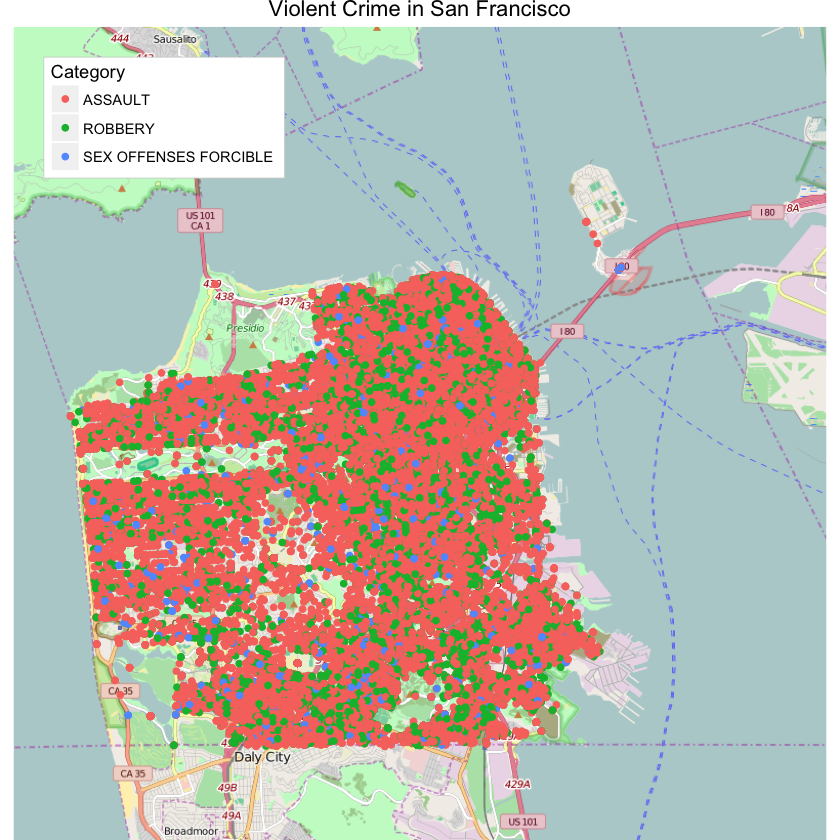

In [6]:
library(ggplot2)
library(ggmap)
map <-
    readRDS("../data/crime/sf-osm.rds")

ggmap(map, extent='device', legend="topleft") +
geom_point(aes(x=X, y=Y, colour=Category), data=mapdata ) +
ggtitle('Violent Crime in San Francisco')


### Observation
This is not a particularly useful map. The colors all overlap and obscure one another.
No patterns are readily visible. The small gaps that interupt the otherwise uniform coverage of the map
seem to correspond to parks and bodies of water, and so is not that unusual. Lets see if
mapping by category will be more revealing.



Warning message:
: Removed 6 rows containing missing values (geom_point).

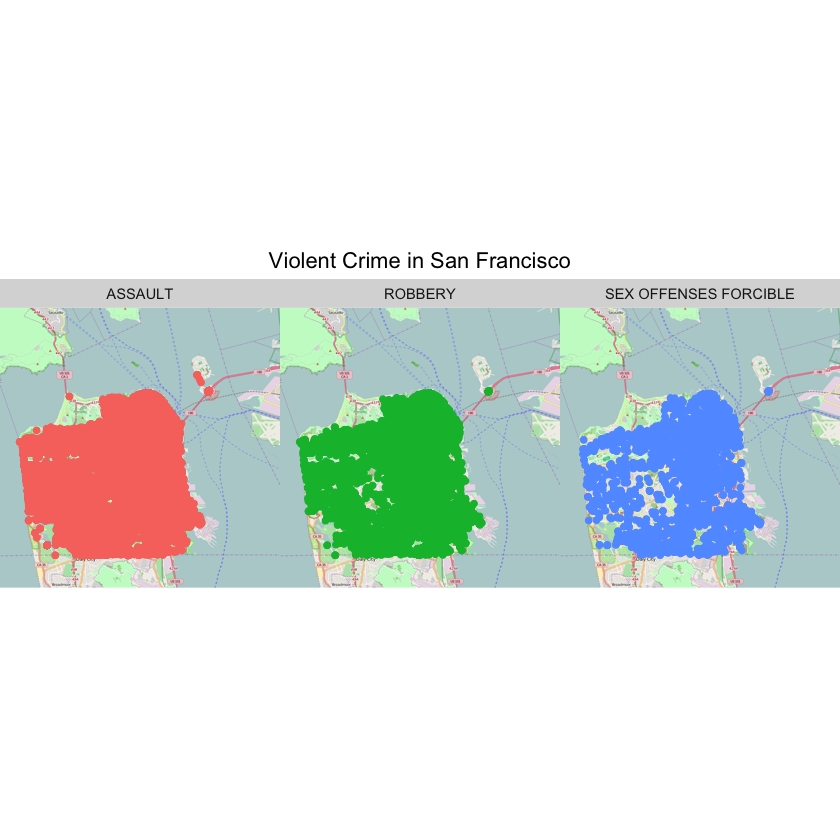

In [7]:
ggmap(map, extent='device') +
geom_point(aes(x=X, y=Y, colour=Category), data=mapdata ) +
scale_colour_discrete(guide='none') +
facet_wrap(~Category) +
ggtitle('Violent Crime in San Francisco')



### Observation
Even when broken out by category the maps aren't particularly revealing. The map coverage is lower for
sex offences, but that is likely due to the overall fewer crimes of that category commiitted.
Maybe a different type of map would be more informative.

Lets try a contour plot. We will estimate the density of crimes from our longitude and latitudes
and use that to plot contours. This should more easily reveal patterns and hotspots for violent crime.



In [8]:
#help(stat_density2d)

Warning message:
: Removed 6 rows containing non-finite values (stat_density2d).

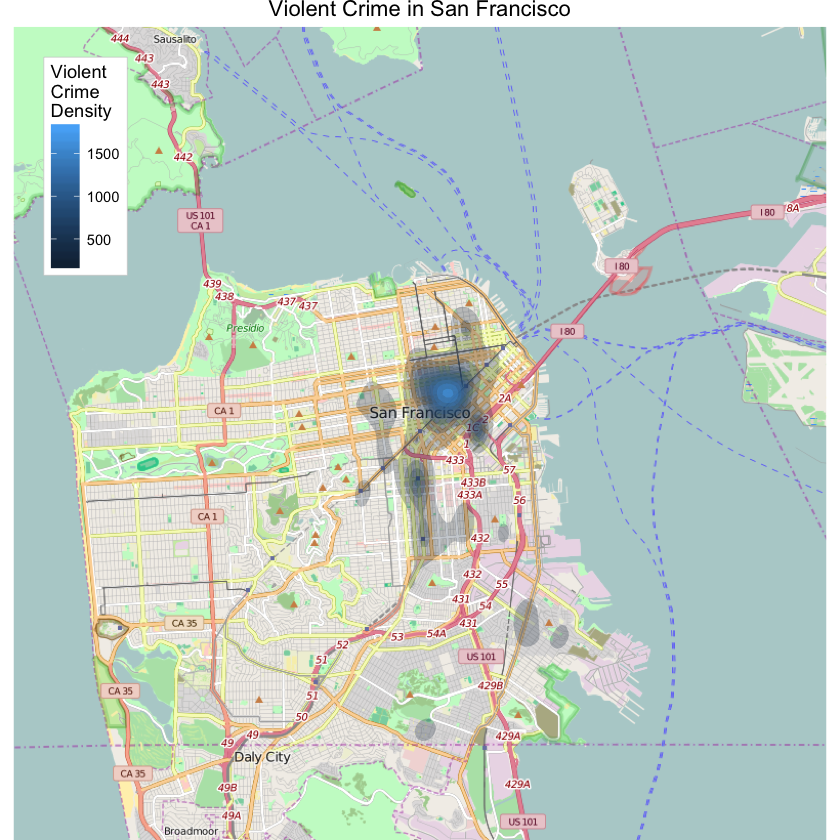

In [9]:
contours <- stat_density2d(
aes(x = X, y = Y, fill = ..level.., alpha=..level..),
size = 0.1, data = mapdata, n=200,
geom = "polygon")

ggmap(map, extent='device', legend="topleft") + contours +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity')+
ggtitle('Violent Crime in San Francisco')


### Observation
This map seems much more informative. It reveals a giant hotspot in the Tenderloin neighborhood, with lots of smaller
hotspots in the surrounding neighborhoods. Additionally, there are spots in the south-east in the Hunter's Point
area and one all the way south in the Vistacion neighborhood.

Lets pull the map in to focus on these areas. Additionally, lets look at maps by specific category of crime.



Warning message:
: Removed 6 rows containing non-finite values (stat_density2d).Warning message:
: Removed 6 rows containing non-finite values (stat_density2d).

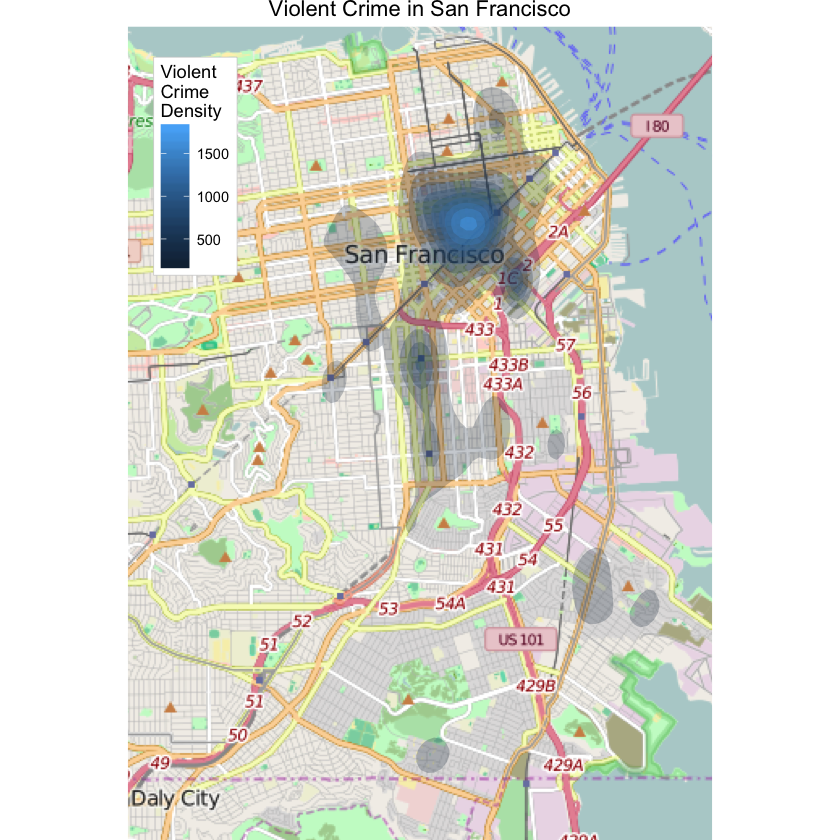

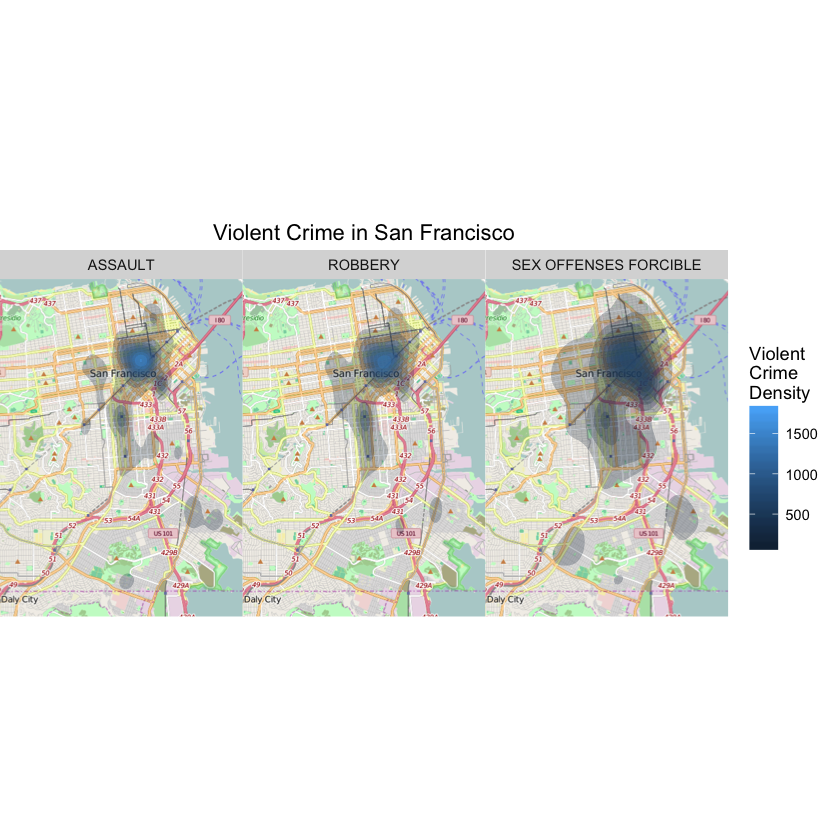

In [10]:

lims <- coord_map(xlim=c(-122.47, -122.37), ylim=c(37.70, 37.81))

ggmap(map, extent='device', legend="topleft") + lims + contours +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity')+
ggtitle('Violent Crime in San Francisco')

ggmap(map, extent='device') + lims + contours +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity') +
facet_wrap(~Category) +
ggtitle('Violent Crime in San Francisco')


### Observation
The overall structure of the contours seem to be about the same as the aggregate, with the largest hotspot
centered in the Tenderloin neighborhood area. With Assault and Robbery, these occurences seem to be much more
concentrated, while Sex Offences seems to cover a larger area. Additionally, a hotspot for Sex Offences appears
in the Outer Mission neighborhood where the others do not have a hotspot. The lower overall density of sex
offences compared to the other categrories of crime is expected, as there are simply fewer crimes of this
category in the data.

Now lets see if any interesting patterns emerge if we start looking at the information temporally.
Lets start with crime by Day of Week.

(Note: I could have created the plots broken out by Category and Day of Week by using
'facet_wrap(~Category+DayOfWeek)'. However that command producem plots too samll to be appreciably viewed.
As such, I broke out the mapping commands for each category separately. Also note that for the bar plots I use the
option scales='free'. While this means that it will be more difficult to use the bar graphs to make absolute
comparisons between the categories, it will allow easier observation of the structure within each category.)



Warning message:
: Removed 6 rows containing non-finite values (stat_density2d).Warning message:
: Removed 4 rows containing non-finite values (stat_density2d).

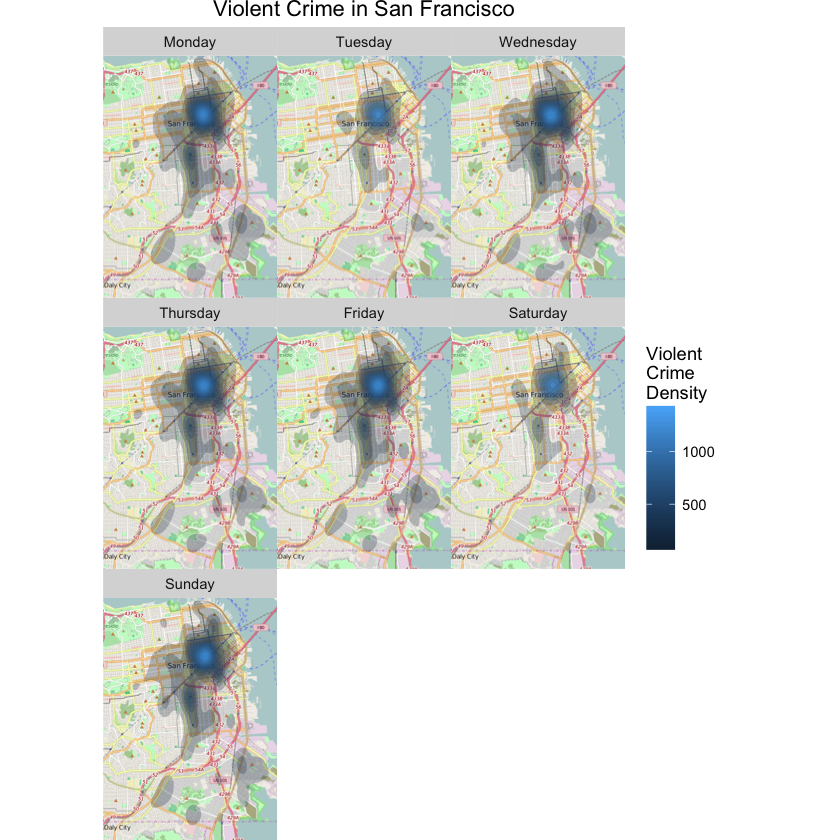

Warning message:
: Removed 1 rows containing non-finite values (stat_density2d).

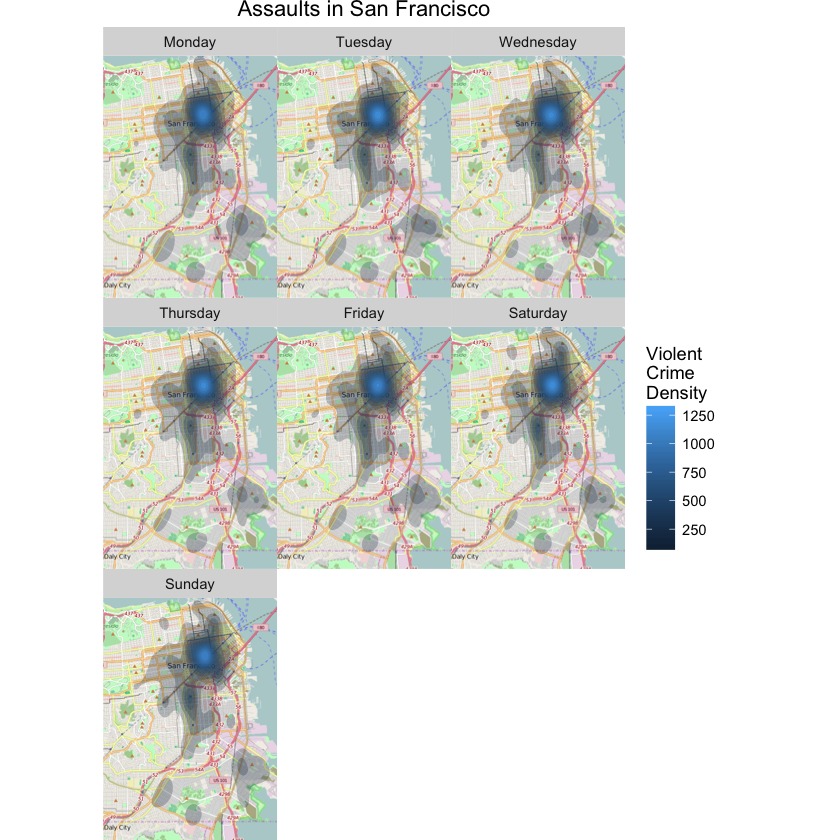

Warning message:
: Removed 1 rows containing non-finite values (stat_density2d).

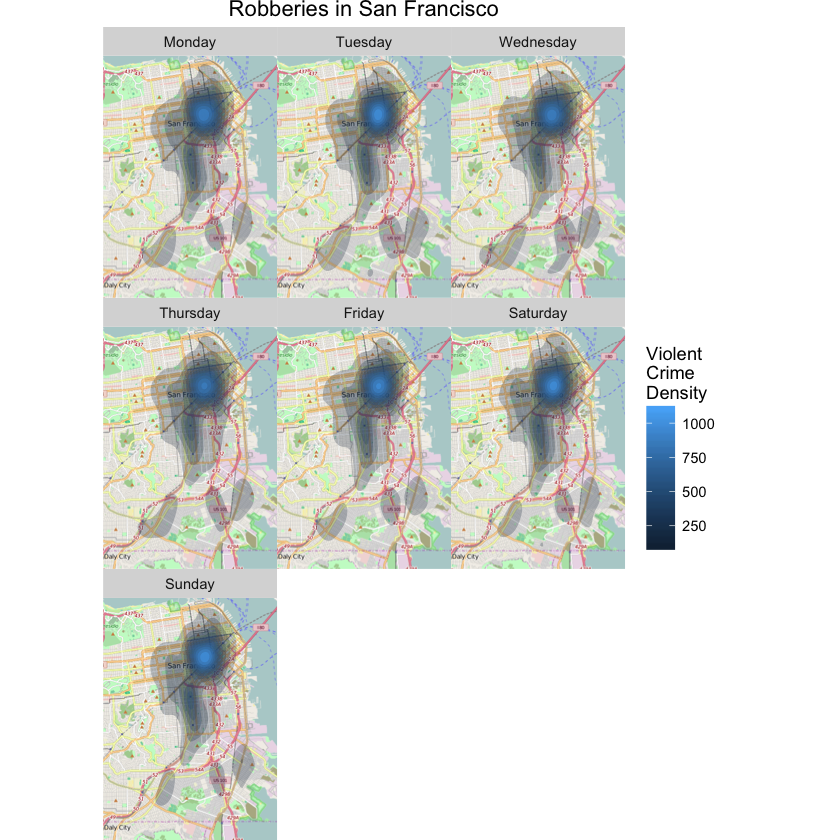

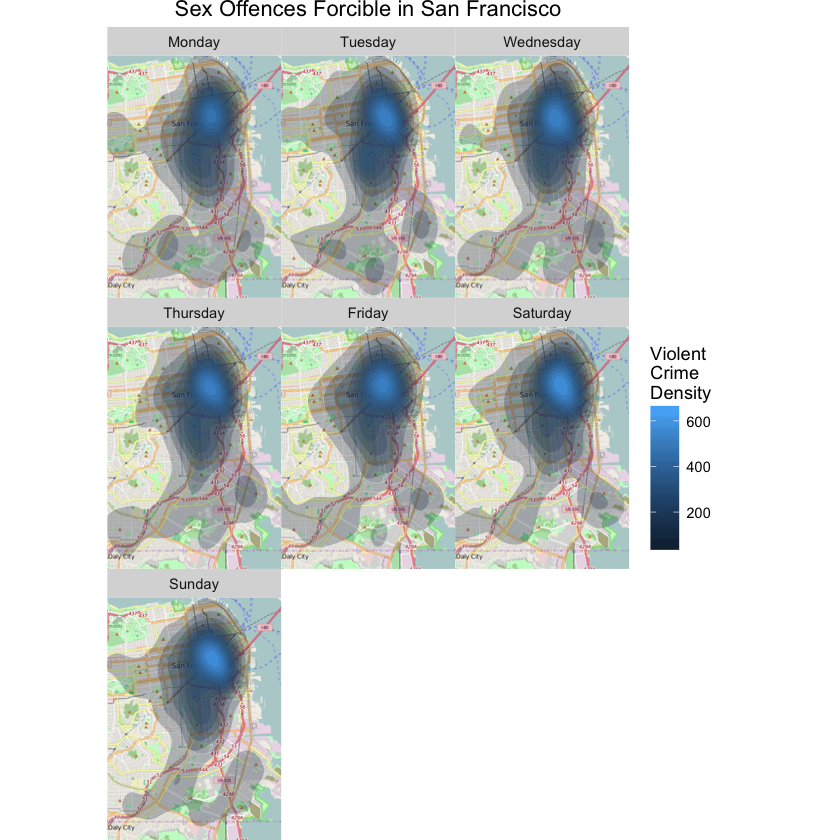

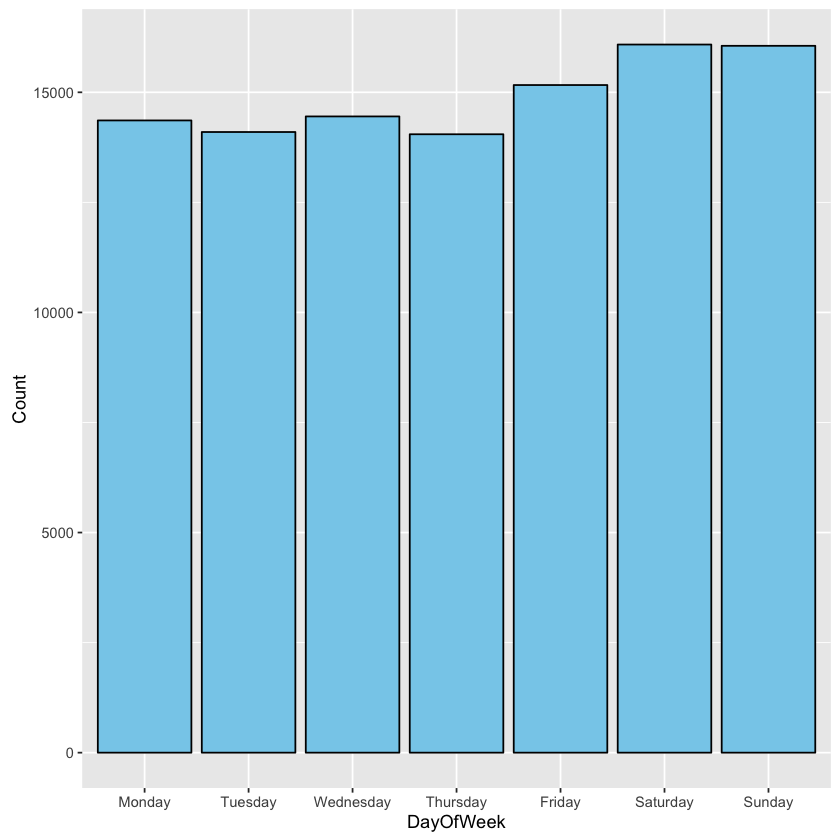

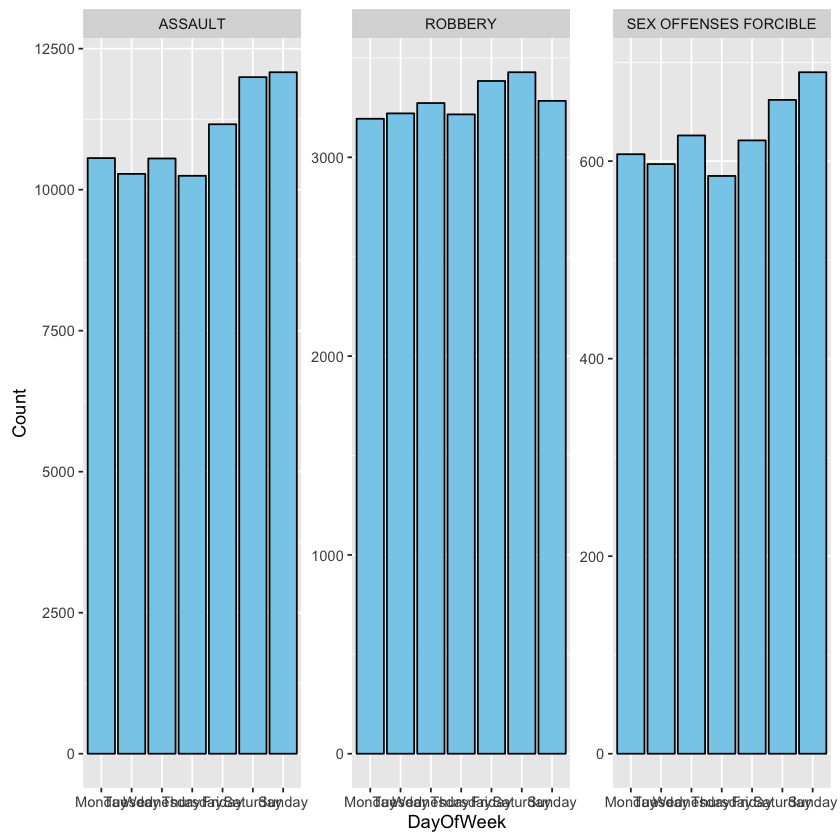

In [11]:
contoursALT <- stat_density2d(
aes(x = X, y = Y, fill = ..level.., alpha=..level..),
size = 0.1, data = filter(mapdata, Category=='ASSAULT'), n=200,
geom = "polygon")

contoursROB <- stat_density2d(
aes(x = X, y = Y, fill = ..level.., alpha=..level..),
size = 0.1, data = filter(mapdata, Category=='ROBBERY'), n=200,
geom = "polygon")

contoursSOF <- stat_density2d(
aes(x = X, y = Y, fill = ..level.., alpha=..level..),
size = 0.1, data = filter(mapdata, Category=='SEX OFFENSES FORCIBLE'), n=200,
geom = "polygon")

ggmap(map, extent='device') + lims + contours +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity') +
facet_wrap(~DayOfWeek) +
ggtitle('Violent Crime in San Francisco')

ggmap(map, extent='device') + lims + contoursALT +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity') +
facet_wrap(~DayOfWeek) +
ggtitle('Assaults in San Francisco')

ggmap(map, extent='device') + lims + contoursROB +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity') +
facet_wrap(~DayOfWeek) +
ggtitle('Robberies in San Francisco')

ggmap(map, extent='device') + lims + contoursSOF +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity') +
facet_wrap(~DayOfWeek) +
ggtitle('Sex Offences Forcible in San Francisco')

ggplot(data=mapdata, aes(x=DayOfWeek)) +
geom_bar(colour="black", fill="skyblue") +
ylab('Count')

ggplot(data=mapdata, aes(x=DayOfWeek)) +
geom_bar(colour="black", fill="skyblue") +
ylab('Count') +
facet_wrap(~Category, scales='free')



### Observation
When looking at violent crime in aggregate, volume seems to be fairly constant, with only a slight bump up on the
weekend. Whats interesting to note is that the crimes seem more concentrated to a central Tenderloin area on
Tuesday, Saturday, and Sunday. The maps on these days exihbit less spread despite crime volume fairly similar to
other days of the week, as shown in the bar plot.

When looking at violent crime by catgory, we see smilar patterns
in crime volume. Assaults and Sex Offences have slight peaks on the weekend, while robbery seems to peak on Friday
and Saturday. The contours also change very little day over day. Interstingly, the more concentrated and less
diffuse contours that are seen in aggregate on
Tuesday, Saturday, and Sunday are not (or are less obviously) visible when looking at the contours for
each category (more investigation needed to find out why, maybe.)

Now lets look by hour.


Warning message:
: Removed 6 rows containing non-finite values (stat_density2d).Warning message:
: Removed 4 rows containing non-finite values (stat_density2d).

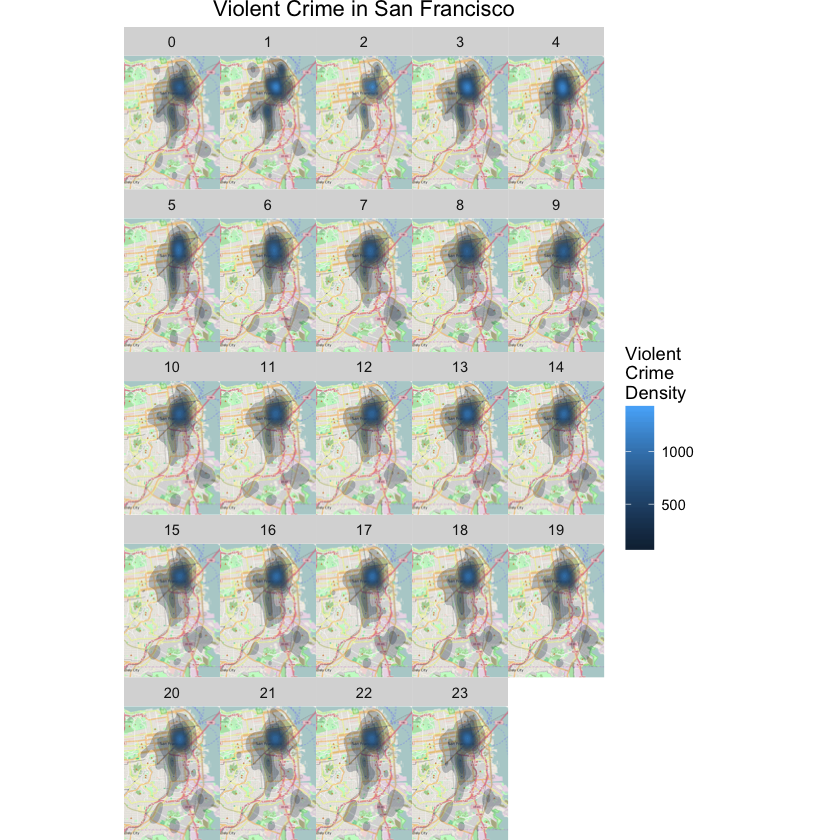

Warning message:
: Removed 1 rows containing non-finite values (stat_density2d).

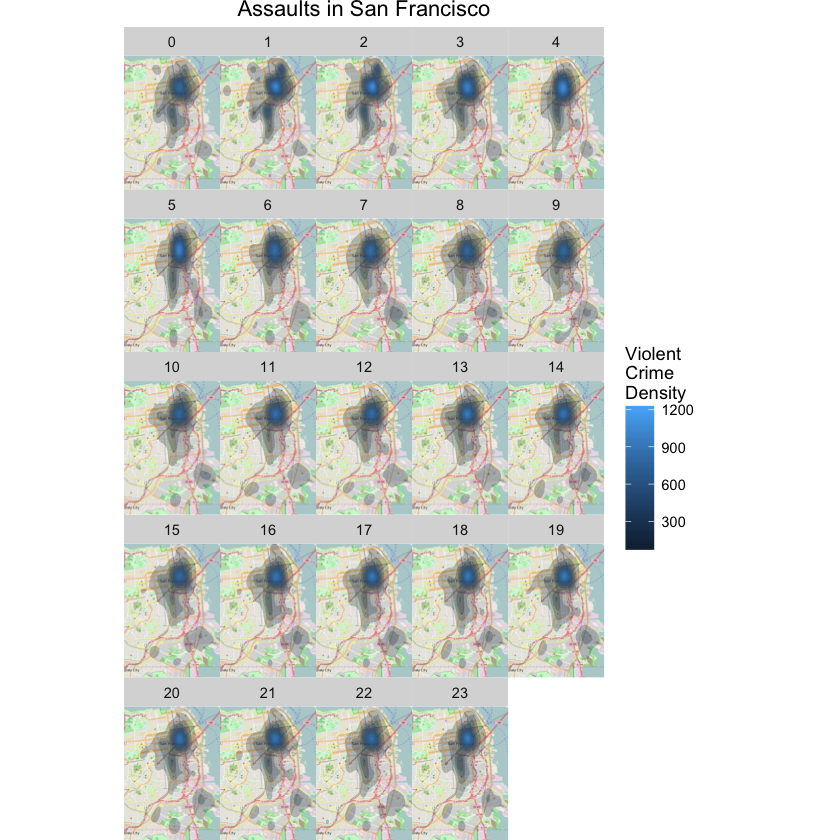

Warning message:
: Removed 1 rows containing non-finite values (stat_density2d).

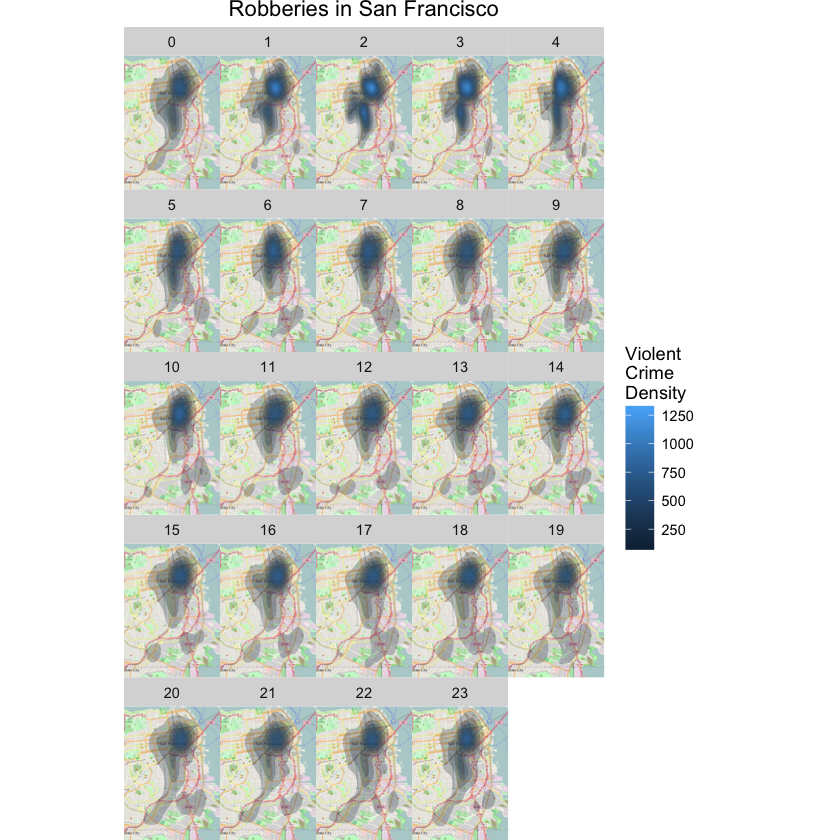

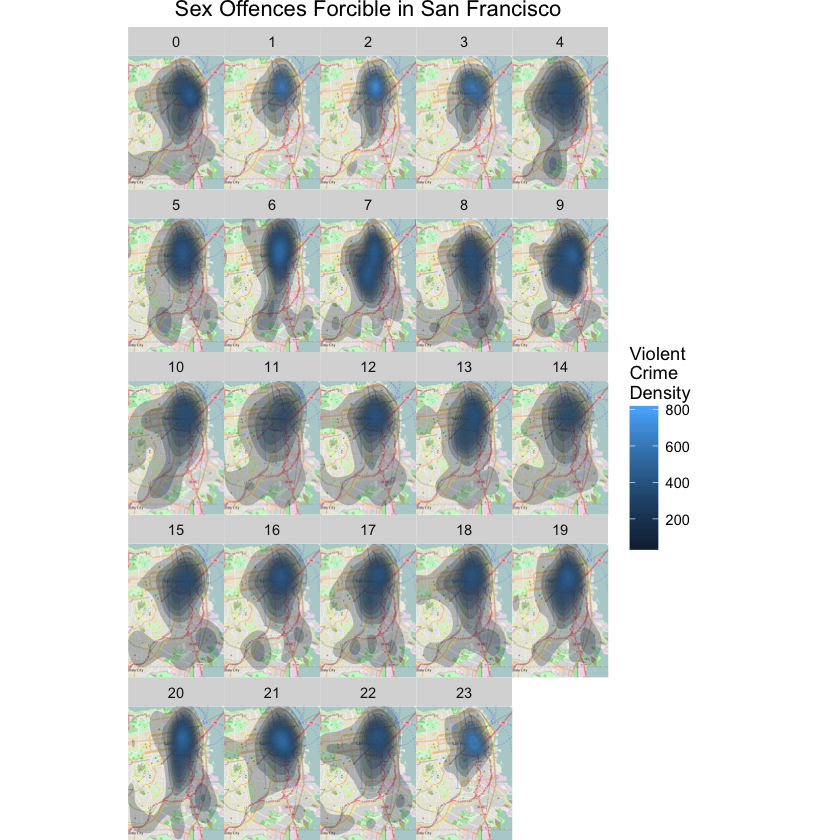

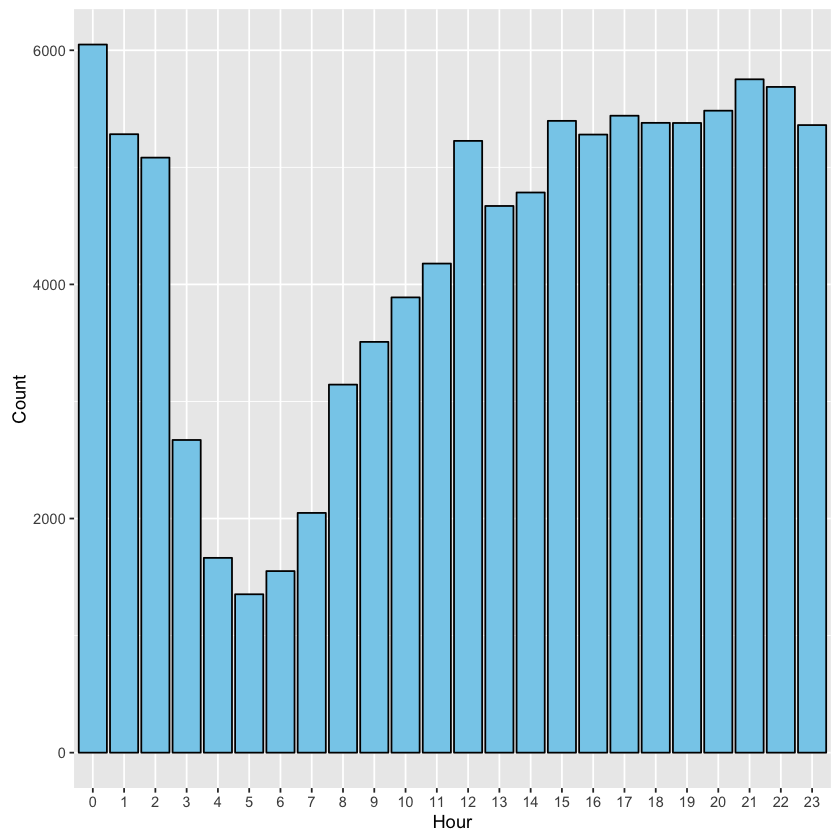

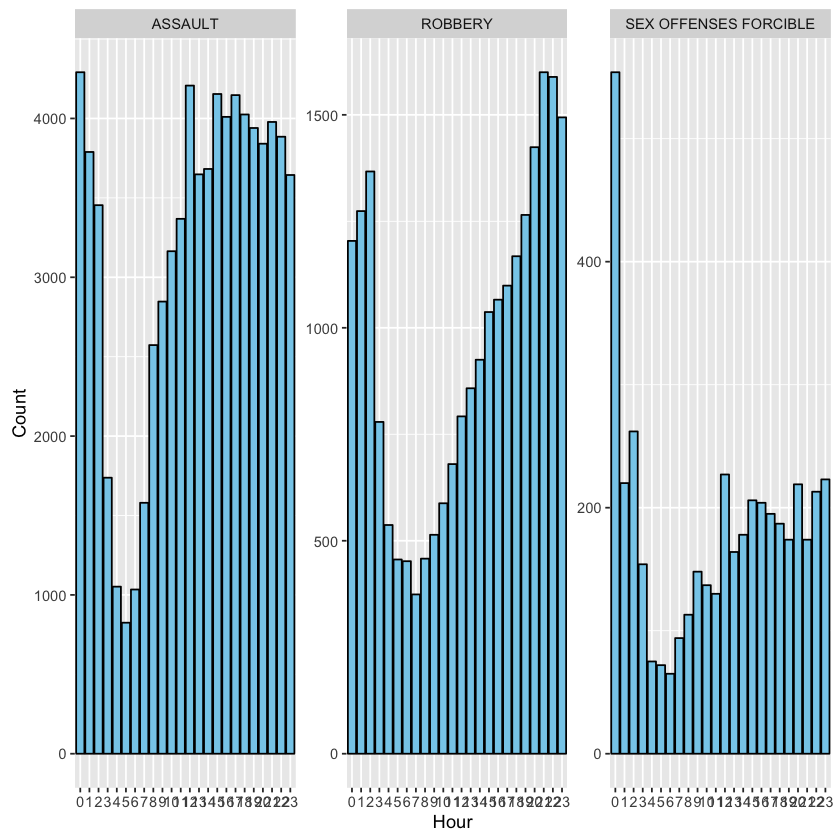

In [12]:

ggmap(map, extent='device') + lims + contours +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity') +
facet_wrap(~Hour) +
ggtitle('Violent Crime in San Francisco')

ggmap(map, extent='device') + lims + contoursALT +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity') +
facet_wrap(~Hour) +
ggtitle('Assaults in San Francisco')

ggmap(map, extent='device') + lims + contoursROB +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity') +
facet_wrap(~Hour) +
ggtitle('Robberies in San Francisco')

ggmap(map, extent='device') + lims + contoursSOF +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity') +
facet_wrap(~Hour) +
ggtitle('Sex Offences Forcible in San Francisco')

ggplot(data=mapdata, aes(x=Hour)) +
geom_bar(colour="black", fill="skyblue") +
ylab('Count')

ggplot(data=mapdata, aes(x=Hour)) +
geom_bar(colour="black", fill="skyblue") +
ylab('Count') +
facet_wrap(~Category, scales='free')



### Observation
When looking in aggregate, there is a logical a dip in the sleepy, early morning twilight hours between 3am and 6am.
It then picks up and holds steady starting around 3pm, before increasing one last time around midnight. The countour
plots don't seem to reveal any large particular variation.

Looking by category reveals some intersting patterns. The dip in robbery occurs later than for the other crimes,
between 5am and 7am. Robbery dips beteen 3am and 5am and sex offences dips between 3am and 6am. Additionally,
robbery peaks around 10pm, two hours earier than the other categories. Also interesting to note is that the
relative peak for sex offences is much larger for sex offences is much larger than the peaks for the other
categories, with the peak for sex offences about twice as high as the next largest value. Looking at the contours,
assault does not show any obvious patterns. Between 1 am and 4am, robbery is much more concentrated in the Tenderloin
neighborhood. Between 1am and 3am, sx offences is similarly concentrated, but it is also highly diffuse in comparison
to the other categories.

Since we have noticed patterns late at night, it will be interesting to incorporate
day of week information into these plots, as people are more likely to be awake at these hours on the weekend.
Lets look at some barplots that do that.


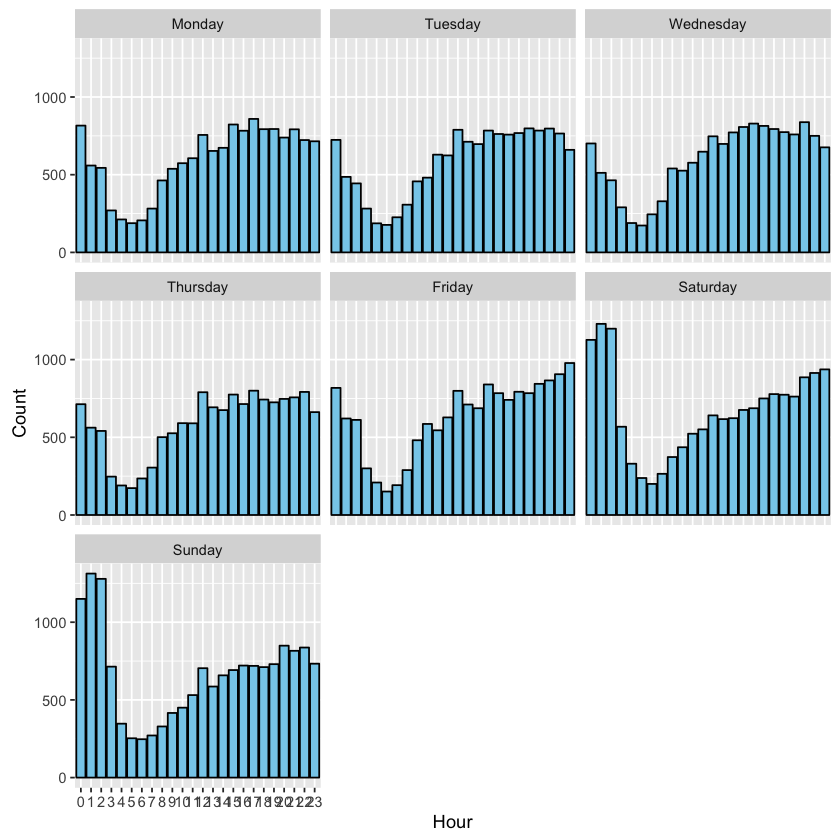

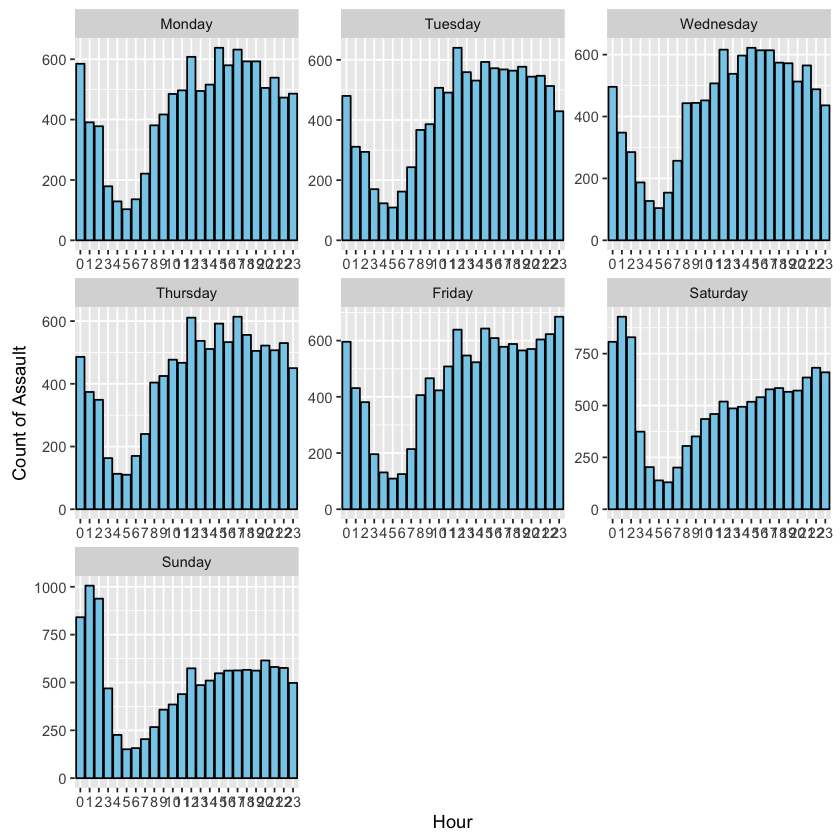

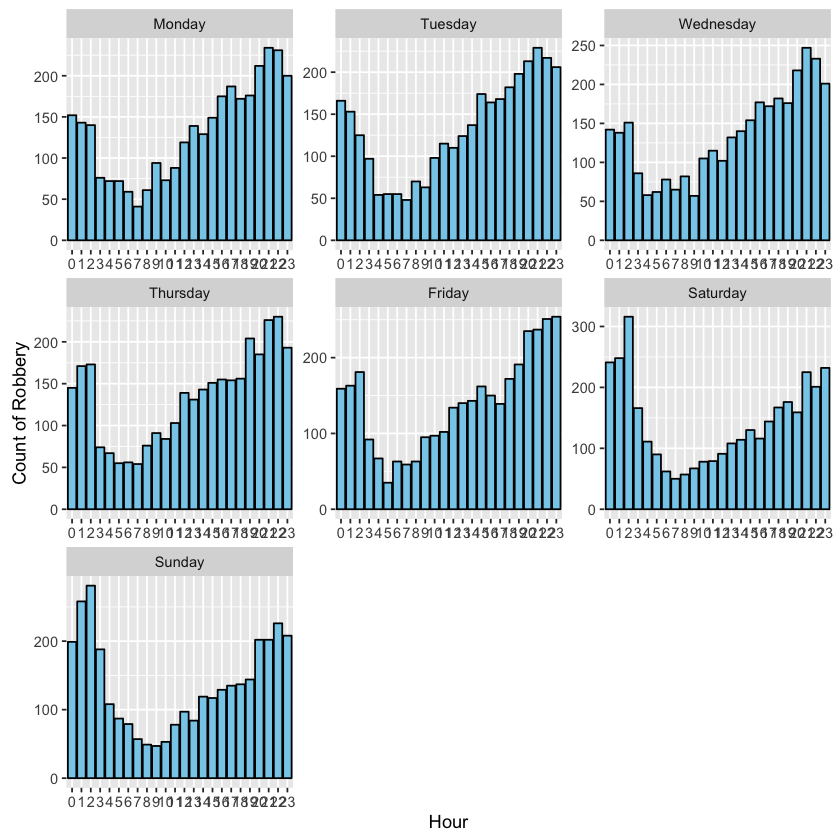

In [13]:
ggplot(data=mapdata, aes(x=Hour)) +
geom_bar(colour="black", fill="skyblue") +
ylab('Count') +
facet_wrap(~DayOfWeek)

ggplot(data=filter(mapdata, Category=='ASSAULT'), aes(x=Hour)) +
geom_bar(colour="black", fill="skyblue") +
ylab('Count of Assault') +
facet_wrap(~DayOfWeek, scales='free')

ggplot(data=filter(mapdata, Category=='ROBBERY'), aes(x=Hour)) +
geom_bar(colour="black", fill="skyblue") +
ylab('Count of Robbery') +
facet_wrap(~DayOfWeek, scales='free')

#ggplot(data=filter(mapdata, Category=='SEX OFFENCES FORCIBLE', aes(x=Hour)) +
#geom_bar(colour="black", fill="skyblue") +
#ylab('Count of Sex Offences') +
#facet_wrap(~DayOfWeek, scales='free')


### Observation
In aggregate, violent crime peaks late at night only on the weekend. When looking by category, Assault shows the
same pattern. During the week, Robbery peaks earier, around 10pm, and on the weekends robbery peaks around 2am.
Sex offenses continues to show a very strong midnight peak every day of the week. I wonder what that effect could
be attributed to.

Now lets look by month



Warning message:
: Removed 6 rows containing non-finite values (stat_density2d).Warning message:
: Removed 4 rows containing non-finite values (stat_density2d).

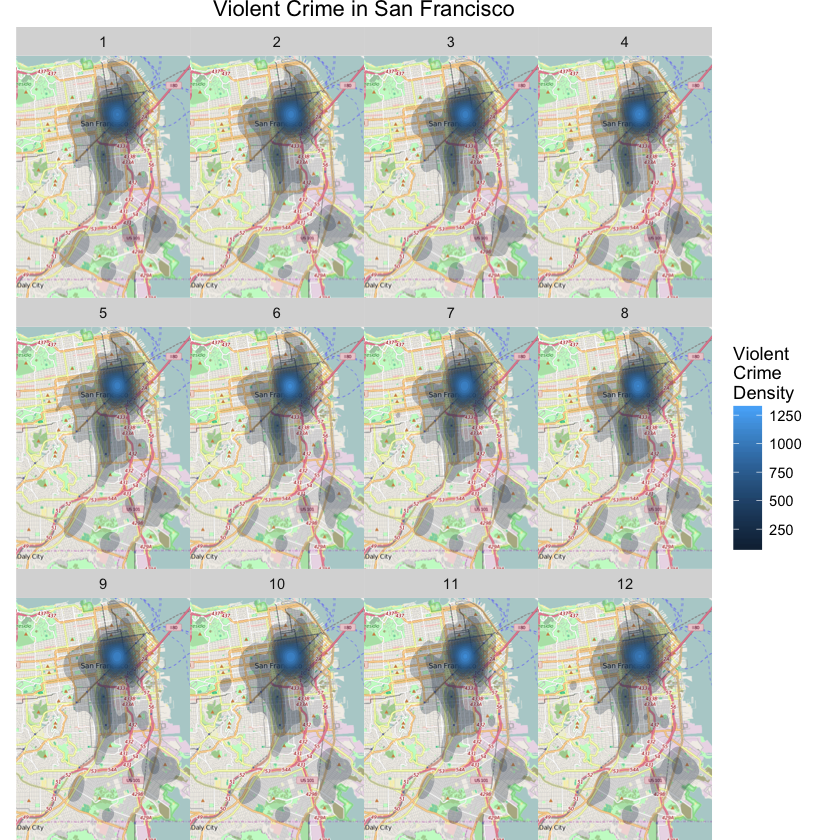

Warning message:
: Removed 1 rows containing non-finite values (stat_density2d).

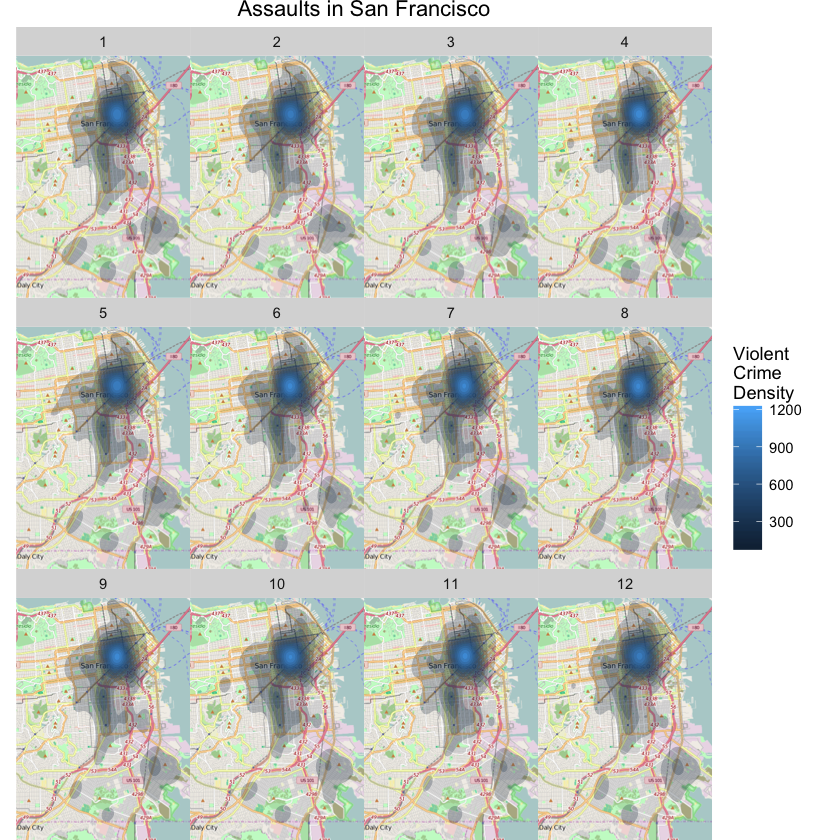

Warning message:
: Removed 1 rows containing non-finite values (stat_density2d).

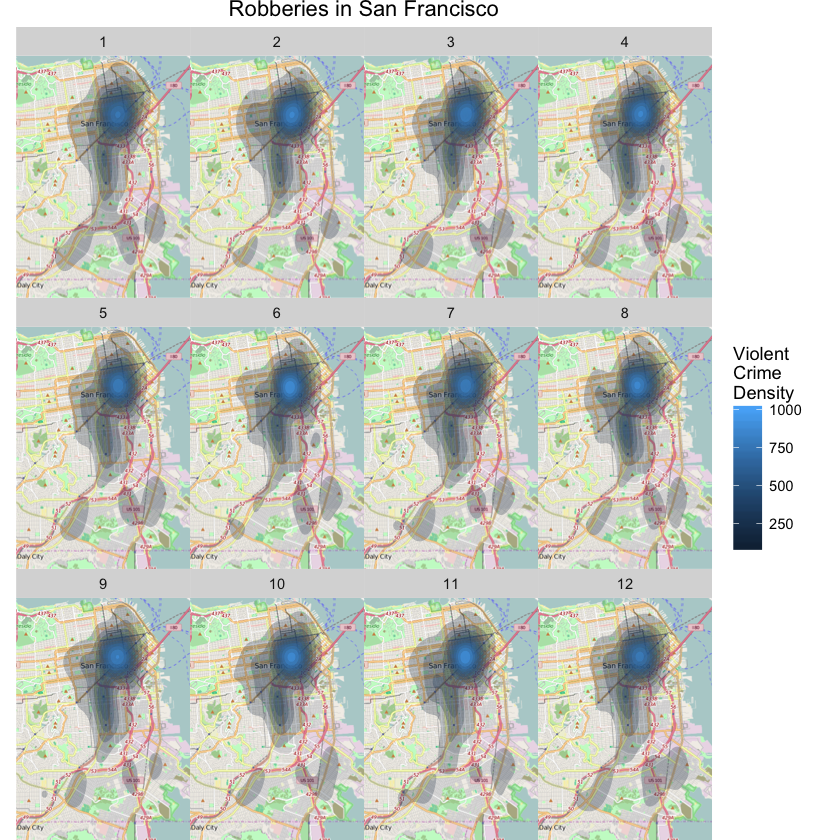

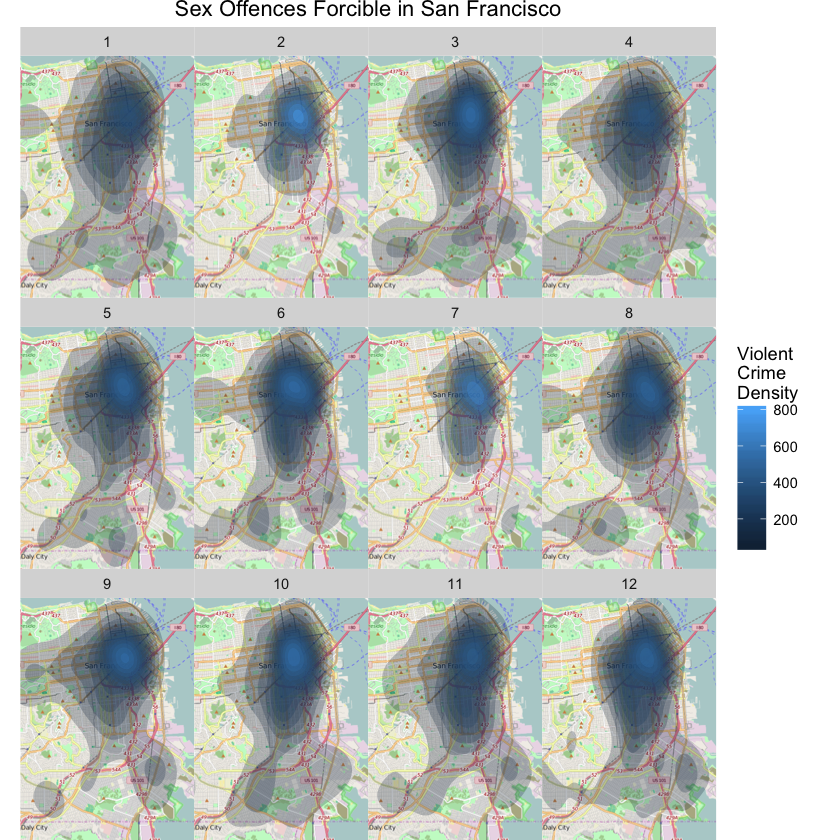

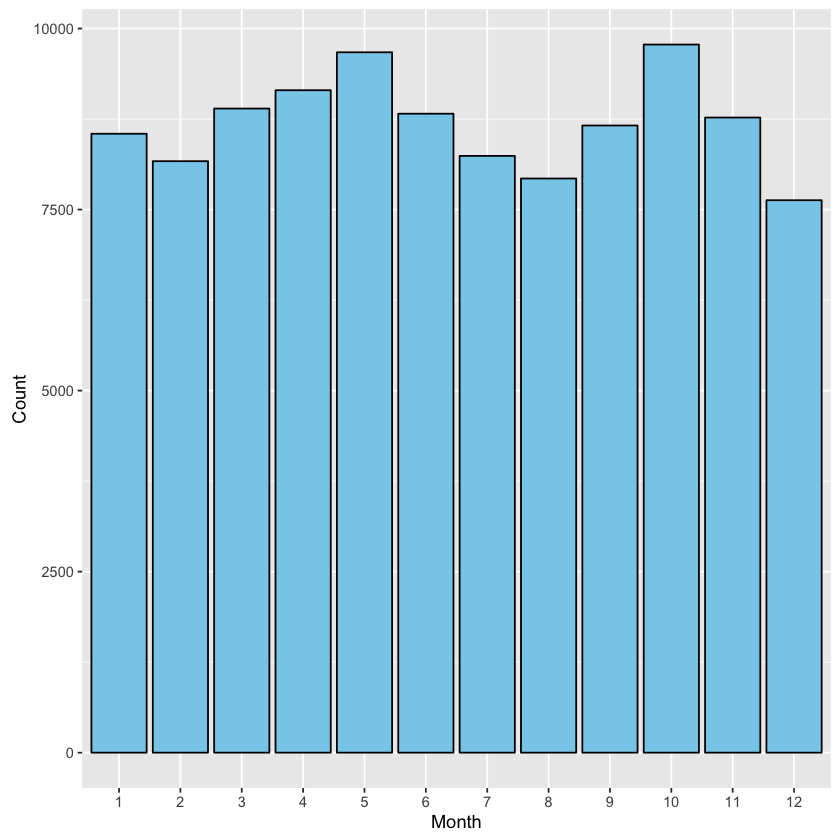

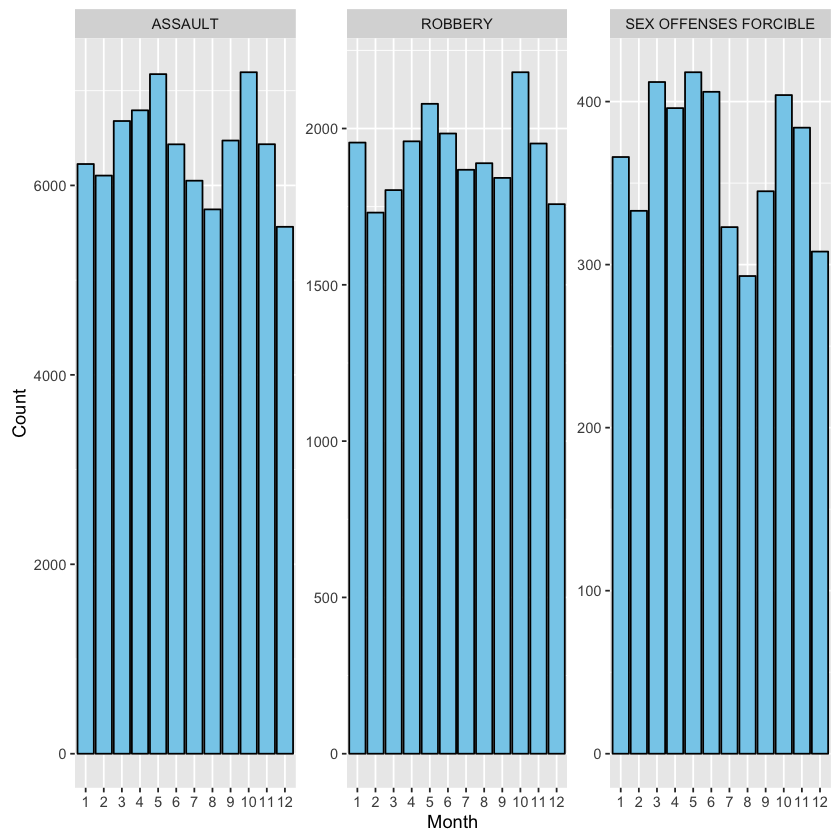

In [14]:

ggmap(map, extent='device') + lims + contours +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity') +
facet_wrap(~Month) +
ggtitle('Violent Crime in San Francisco')

ggmap(map, extent='device') + lims + contoursALT +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity') +
facet_wrap(~Month) +
ggtitle('Assaults in San Francisco')

ggmap(map, extent='device') + lims + contoursROB +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity') +
facet_wrap(~Month) +
ggtitle('Robberies in San Francisco')

ggmap(map, extent='device') + lims + contoursSOF +
scale_alpha_continuous(range=c(0.25,0.4), guide='none') +
scale_fill_gradient('Violent\nCrime\nDensity') +
facet_wrap(~Month) +
ggtitle('Sex Offences Forcible in San Francisco')

ggplot(data=mapdata, aes(x=Month)) +
geom_bar(colour="black", fill="skyblue") +
ylab('Count')

ggplot(data=mapdata, aes(x=Month)) +
geom_bar(colour="black", fill="skyblue") +
ylab('Count') +
facet_wrap(~Category, scales='free')



### Observation
The barplots reveal a small cylical pattern where there are peaks in the Spring and Fall, and dips in the Summer
and Winter. It seems that more extreme weather has a small effect at reducing violent crime. This is seen in the
plot in aggregate, and in the plots by category. The contour plots don't really show any patterns except for sex
offences, which shows much more concentrated contours in February and July.


#Summary
Just a very high level recap of what has been learned.

-- Contour Plots work better than plotting the points themselves for this data.
-- Violent crime seems to be concentrated aroud Tenderloin, with more distant spots in the Hunter's Point,
Vistacion, and Outer Mission Area.
-- Sex Offences seems to be concentrated more diffusely about these hotspots compared to the other two.
-- Violent crime is down early in the morning, up on the weekends, and down during the Summer and Winter.
-- Robbery peaks slightly earlier than the rest of violent crime during the week.
-- Assault is by far the most common violent crime.

# Final Note
Many of the things discussed here might seem fairly obvious.
'Of course there will be less violent crime at those hours; everyone is asleep!' or 'Of course there is less
violent crime in the Summer and Winter, everyone wants to stay indoors!' Because those things are so obvious,
it is a good thing that we see those effects! If we didn't, it might indicate errors in the data. More
excitingly, it could also reveal a truly unique effect in the data. I feel its good
practice to make sure any obvious expectations are also evident in the data, as it is an easy way to improve
the quality of the analysis.



In [15]:
#help('%>%')